In [15]:
import sys
sys.path.append("../")
sys.path.append("../diffusion")

import utils
import guidance
import matplotlib.pyplot as plt
from pathlib import Path
import os
import torch
from torch_geometric.data import Data
import pickle

DEVICE = "cuda:0"

def plot_set(data_set, nrows = 3, ncols = 6, scale_factor = 1.0):
    fig, axes = plt.subplots(nrows, ncols)
    fig.set_size_inches(scale_factor*ncols*2, scale_factor*nrows*2)
    for i, (x, cond) in enumerate(data_set):
        img = utils.visualize_placement(x, cond)
        ax = axes[i//ncols][i%ncols] if nrows > 1 else axes[i%ncols]
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()

def preprocess_placement(x, cond, scale=1):
    if len(cond.chip_size) == 4: # chip_size is [x_start, y_start, x_end, y_end]
        chip_size = (cond.chip_size[2] - cond.chip_size[0], cond.chip_size[3] - cond.chip_size[1])
        chip_offset = (cond.chip_size[0], cond.chip_size[1])
    else:
        chip_size = (cond.chip_size[0], cond.chip_size[1])
        chip_offset = (0, 0)
    chip_size = torch.tensor(chip_size, dtype = torch.float32).view(1, 2)
    chip_offset = torch.tensor(chip_offset, dtype = torch.float32).view(1, 2)
    x = (torch.tensor(x, dtype=torch.float32) - chip_offset)/scale
    x = 2 * (x / chip_size) - 1
    # use center of instance as coordinate point and reference for terminal
    x = x + cond.x/2
    return x

def eval_set(data_set, eval_fn, **kwargs):
    return [eval_fn(x, cond, normalized_hpwl=False, **kwargs)[1] for (x, cond) in data_set]

def plot_and_eval_set(data_set, eval_fn, nrows = 3, ncols = 6, scale_factor = 1.0, title=None):
    fig, axes = plt.subplots(nrows, ncols)
    fig.set_size_inches(scale_factor*ncols*2, scale_factor*nrows*2 + 0.2)
    if title:
        fig.suptitle(title)
    for i, (x, cond) in enumerate(data_set):
        img = utils.visualize_placement(x, cond)
        ax = axes[i//ncols][i%ncols] if nrows > 1 else axes[i%ncols]
        ax.imshow(img)
        ax.set_xticks([])
        ax.set_yticks([])
        metric = eval_fn(x, cond, normalized_hpwl=False)[1]
        ax.set_title(f"{metric:.0f}")
    plt.show()

def plot_and_print_metrics(metrics, images, nrows = 3, ncols = 6, scale_factor = 1.0, title=None):
    fig, axes = plt.subplots(nrows, ncols)
    fig.set_size_inches(scale_factor*ncols*2, scale_factor*nrows*2 + 0.2)
    if title:
        fig.suptitle(title)
    for i, (metric, image) in enumerate(zip(metrics, images)):
        ax = axes[i//ncols][i%ncols] if nrows > 1 else axes[i%ncols]
        ax.imshow(image.T, origin="lower", cmap="gray_r")
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(f"{metric:.5g}")
    plt.show()

def write_results(data_dict, filename):
    results_dir = "results"
    os.makedirs(results_dir, exist_ok=True)
    out_path = os.path.join(results_dir, filename)
    utils.dict_to_csv(data_dict, out_path)
    print(f"wrote results with keys {data_dict.keys()} to {out_path}")

def from_pl(base_path, circuit_name="adaptec1"):
    # converts placements to a pl output, produces data as torch (V, 2) tensor
    data = []
    fixed_mask = []
    original_pl_file = os.path.join(base_path, circuit_name, f"{circuit_name}_placed.pl")
    with open(original_pl_file, "r") as f:
        i = 0
        for line in f.readlines():
            line_stripped = line.strip()
            if not line_stripped.startswith("o") and not line_stripped.startswith("p"):
                continue # not relevant to placement
            else:
                line_split = line_stripped.split()
                # This is disgusting and messy, pls fix
                data.append((float(line_split[1]), float(line_split[2])))
                if len(line_split) > 5:
                    if "/FIXED" in line_stripped:
                        fixed_mask.append(True)
                    else:
                        fixed_mask.append(False)
                else:
                    if "/FIXED" in line_stripped: # unexpected
                        import ipdb; ipdb.set_trace()
                    fixed_mask.append(False)
                i += 1
    data = torch.tensor(data) # (V, 2)
    data = data / 1000 # TRICK FOR ISPD
    fixed_mask = torch.tensor(fixed_mask) # (V,)
    V, _ = data.shape
    assert fixed_mask.shape[0] == V, "parsing error: mask and placement data shapes dont match!"
    return data, fixed_mask

def load_ispd_placements(base_dir, graph_dataset):
    # Generates dataset of (x, cond) using placements from base_dir and cond from graph_dataset
    ispd_mapping = [f"adaptec{i+1}" for i in range(4)] + [f"bigblue{i+1}" for i in range(4)] # maps file_idx to placement name
    out_set = []
    for _, cond in graph_dataset:
        circuit_name = ispd_mapping[cond.file_idx]
        load_path = os.path.join(base_dir, circuit_name, f"{circuit_name}_placed.pl")
        if not os.path.exists(load_path):
            print(f"skipping {circuit_name}, {load_path} not found")
            continue
        placement, fixed_mask = from_pl(base_dir, circuit_name)
        cond["fixed_mask"] = fixed_mask
        placement = preprocess_placement(placement, cond)
        out_set.append((placement, cond))
    return out_set

## Loading Placements

### ISPD

Train set and val set sizes:  0 8
cuda:0 cuda:0
# objects: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# objects in placement: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# edges: [14584, 18938, 23402, 28864, 5952, 144446, 32900, 223314]
# macros: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# ports: [0, 0, 0, 0, 0, 0, 0, 0]
Data(
  x=[543, 2],
  edge_index=[2, 14584],
  edge_attr=[14584, 4],
  is_ports=[543],
  is_macros=[543],
  vertex_map=[543],
  edge_pin_id=[14584, 2],
  file_idx=0,
  name_index_mapping={
    o0=0,
    o1=1,
    o2=2,
    o3=3,
    o4=4,
    o5=5,
    o6=6,
    o7=7,
    o8=8,
    o9=9,
    o10=10,
    o11=11,
    o12=12,
    o13=13,
    o14=14,
    o15=15,
    o16=16,
    o17=17,
    o18=18,
    o19=19,
    o20=20,
    o21=21,
    o22=22,
    o23=23,
    o24=24,
    o25=25,
    o26=26,
    o27=27,
    o28=28,
    o29=29,
    o30=30,
    o31=31,
    o32=32,
    o33=33,
    o34=34,
    o35=35,
    o36=36,
    o37=37,
    o38=38,
    o39=39,
    o40=40,
    o41

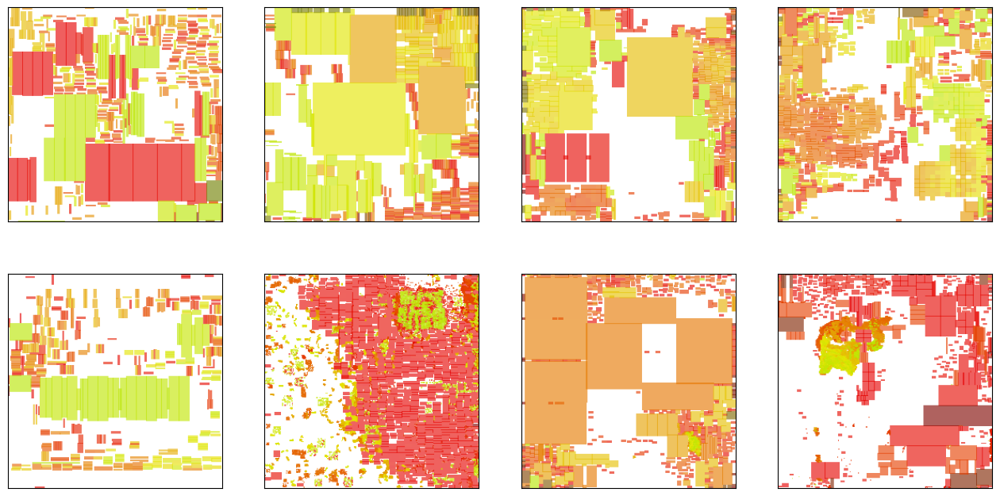

In [17]:
task = "ispd2005"
placement_name = "ispd2005.eval_macro_only.300"

placement_dir = f"../logs/diffusion_debug/{placement_name}/samples"
train_set, val_set = utils.load_graph_data_with_config(
    task, 
    train_data_limit = None, 
    val_data_limit = None,
    )

print("Train set and val set sizes: ", len(train_set), len(val_set))

placement_paths = [os.path.join(placement_dir, f"sample{cond.file_idx}.pkl") for _, cond in val_set]
placements = [preprocess_placement(utils.open_pickle(path), cond) for path, (_, cond) in zip(placement_paths, val_set)]

placed_set = [(x.to(device=DEVICE), cond.to(device=DEVICE)) for x, (_, cond) in zip(placements, val_set)]
placed_set = [utils.remove_non_macros(x, cond) for x, cond in placed_set] # This step is not strictly necessary, just speeds up plotting
print(placed_set[0][0].device, placed_set[0][1].x.device)

num_objects = [cond.num_nodes for (x, cond) in placed_set]
num_placement_objects = [x.shape[0] for (x, cond) in placed_set]
num_edges = [cond.num_edges for (x, cond) in placed_set]
num_macros = [cond.is_macros.sum().cpu().item() for (x, cond) in placed_set]
num_ports = [cond.is_ports.sum().cpu().item() for (x, cond) in placed_set]
print("# objects:", num_objects)
print("# objects in placement:", num_placement_objects)
print("# edges:", num_edges)
print("# macros:", num_macros)
print("# ports:", num_ports)
print(placed_set[0][1])

plot_set(placed_set, nrows=2, ncols=4, scale_factor=2)

### IBM

Train set and val set sizes:  0 18
cuda:0 cuda:0
# objects: [758, 783, 802, 807, 512, 690, 803, 813, 765, 1298, 885, 1163, 936, 1126, 905, 970, 1272, 797]
# objects in placement: [758, 783, 802, 807, 512, 690, 803, 813, 765, 1298, 885, 1163, 936, 1126, 905, 970, 1272, 797]
# edges: [42290, 79868, 70276, 75210, 115506, 93404, 125512, 168792, 147632, 214336, 160636, 253392, 210336, 304556, 375804, 437208, 572246, 465704]
# macros: [246, 271, 290, 295, 0, 178, 291, 301, 253, 786, 373, 651, 424, 614, 393, 458, 760, 285]
# ports: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Data(x=[758, 2], edge_index=[2, 42290], edge_attr=[42290, 4], is_ports=[758], is_macros=[758], cluster_map=[12752], edge_pin_id=[42290, 2], chip_size=[4], file_idx=0)


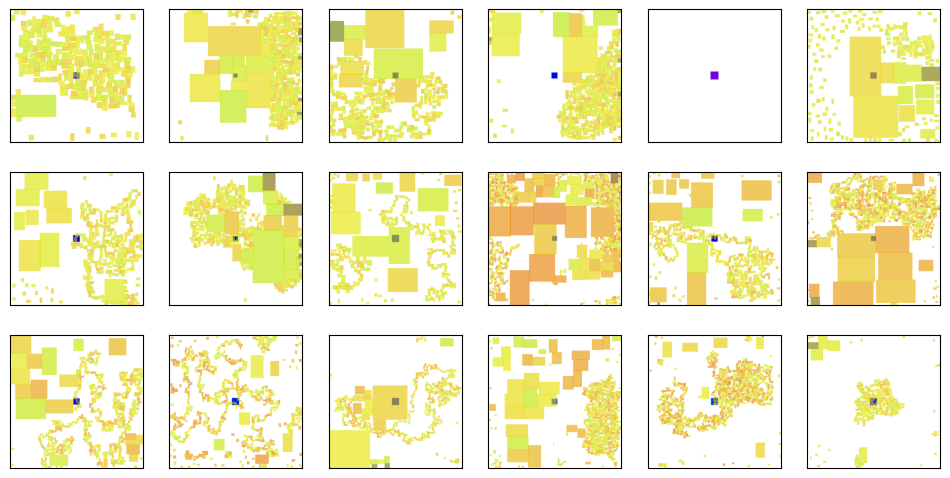

In [95]:
task = "ibm-cluster512"
placement_name = "ibm-cluster512.eval_macro_only.300"

placement_dir = f"../logs/diffusion_debug/{placement_name}/samples"

train_set, val_set = utils.load_graph_data_with_config(
    task, 
    train_data_limit = None, 
    val_data_limit = None,
    )

print("Train set and val set sizes: ", len(train_set), len(val_set))

placement_paths = [os.path.join(placement_dir, f"sample{cond.file_idx}.pkl") for _, cond in val_set]
placements = [preprocess_placement(utils.open_pickle(path), cond) for path, (_, cond) in zip(placement_paths, val_set)]

placed_set = [(x.to(device=DEVICE), cond.to(device=DEVICE)) for x, (_, cond) in zip(placements, val_set)]
print(placed_set[0][0].device, placed_set[0][1].x.device)

num_objects = [cond.num_nodes for (x, cond) in placed_set]
num_placement_objects = [x.shape[0] for (x, cond) in placed_set]
num_edges = [cond.num_edges for (x, cond) in placed_set]
num_macros = [cond.is_macros.sum().cpu().item() for (x, cond) in placed_set]
num_ports = [cond.is_ports.sum().cpu().item() for (x, cond) in placed_set]
print("# objects:", num_objects)
print("# objects in placement:", num_placement_objects)
print("# edges:", num_edges)
print("# macros:", num_macros)
print("# ports:", num_ports)
print(placed_set[0][1])

plot_set(placed_set, nrows=3, ncols=6, scale_factor=1)

Train set and val set sizes:  0 18
cpu cpu
# objects: [246, 271, 290, 295, 0, 178, 291, 301, 253, 786, 373, 651, 424, 614, 393, 458, 760, 285]
# objects in placement: [246, 271, 290, 295, 0, 178, 291, 301, 253, 786, 373, 651, 424, 614, 393, 458, 760, 285]
# edges: [2040, 1728, 1246, 1854, 0, 184, 1138, 3972, 904, 5120, 1378, 3758, 1730, 4680, 1546, 4452, 4622, 1746]
# macros: [246, 271, 290, 295, 0, 178, 291, 301, 253, 786, 373, 651, 424, 614, 393, 458, 760, 285]
# ports: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
Data(x=[246, 2], edge_index=[2, 2040], edge_attr=[2040, 4], is_ports=[246], is_macros=[246], vertex_map=[246], edge_pin_id=[2040, 2], file_idx=0, chip_size=[4], original_cond=Data(x=[12752, 2], edge_index=[2, 72910], edge_attr=[72910, 4], is_ports=[12752], is_macros=[12752], edge_pin_id=[72910, 2], chip_size=[4], file_idx=0))


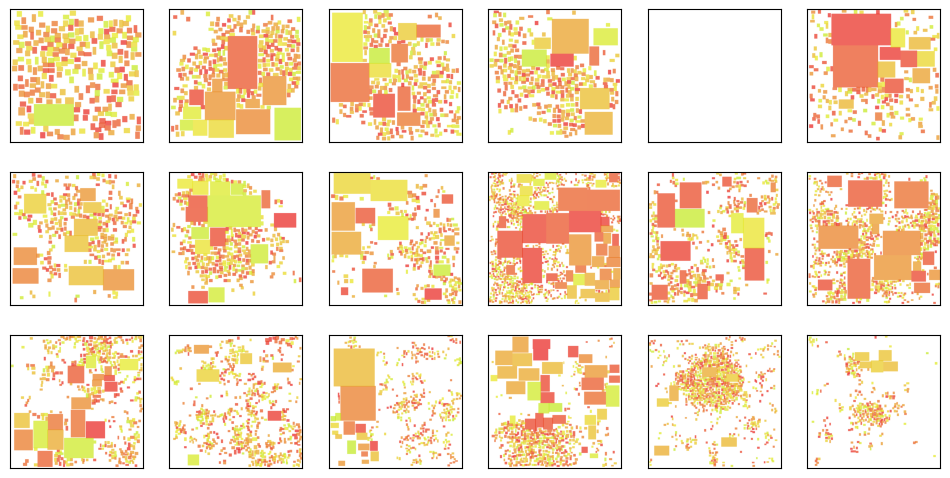

In [132]:
task = "ibm_maskplace.cluster0.1"
placement_name = None
placement_dir = f"../logs/diffusion_debug/{placement_name}/samples" if placement_name is not None else None

train_set, val_set = utils.load_graph_data_with_config(
    task, 
    train_data_limit = None, 
    val_data_limit = None,
    )

print("Train set and val set sizes: ", len(train_set), len(val_set))

if placement_dir is None:
    placed_set = val_set
else:
    placement_paths = [os.path.join(placement_dir, f"sample{cond.file_idx}.pkl") for _, cond in val_set]
    # placement_paths = [os.path.join(placement_dir, f"output{cond.file_idx}.pickle") for _, cond in val_set]
    placements = [preprocess_placement(utils.open_pickle(path), cond) for path, (_, cond) in zip(placement_paths, val_set)]
    placed_set = [(x.to(device=DEVICE), cond.to(device=DEVICE)) for x, (_, cond) in zip(placements, val_set)]
placed_set = [utils.remove_non_macros(x, cond) for x, cond in placed_set] # This step is not strictly necessary, just speeds up plotting
print(placed_set[0][0].device, placed_set[0][1].x.device)

num_objects = [cond.num_nodes for (x, cond) in placed_set]
num_placement_objects = [x.shape[0] for (x, cond) in placed_set]
num_edges = [cond.num_edges for (x, cond) in placed_set]
num_macros = [cond.is_macros.sum().cpu().item() for (x, cond) in placed_set]
num_ports = [cond.is_ports.sum().cpu().item() for (x, cond) in placed_set]
print("# objects:", num_objects)
print("# objects in placement:", num_placement_objects)
print("# edges:", num_edges)
print("# macros:", num_macros)
print("# ports:", num_ports)
print(placed_set[0][1])

plot_set(placed_set, nrows=3, ncols=6, scale_factor=1)

### ISPD From .pl Files

Train set and val set sizes:  0 8
# objects: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# objects in placement: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# edges: [14584, 18938, 23402, 28864, 5952, 144446, 32900, 223314]
# macros: [543, 566, 723, 1329, 560, 23084, 1298, 8170]
# ports: [0, 0, 0, 0, 0, 0, 0, 0]
# fixed in pl: [543, 566, 723, 1329, 560, 23084, 1298, 8170]


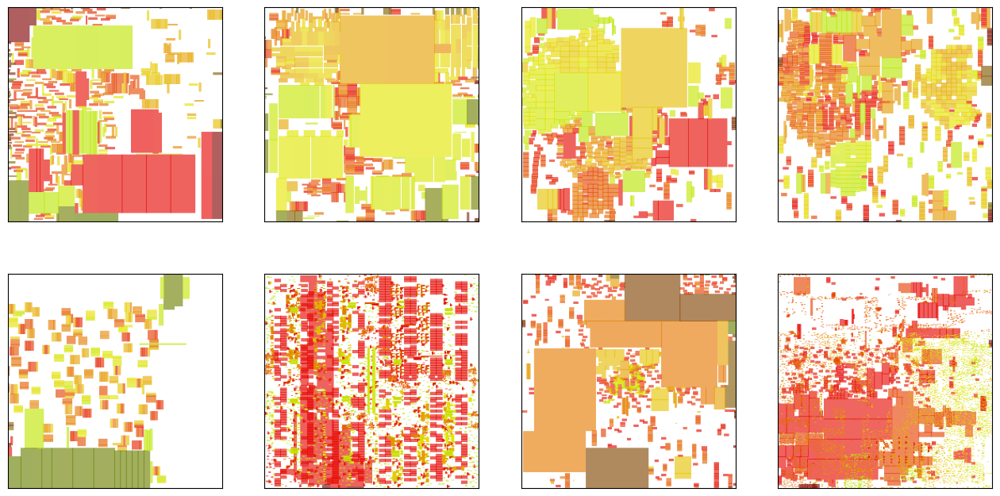

In [13]:
task = "ispd2005-s0"
placement_name = "chipformer"
placement_dir = f"placements/{placement_name}/ispd2005"
train_set, val_set = utils.load_graph_data_with_config(
    task, 
    train_data_limit = None, 
    val_data_limit = None,
    )

print("Train set and val set sizes: ", len(train_set), len(val_set))

if placement_dir is None:
    placed_set = val_set
else:
    placed_set = load_ispd_placements(placement_dir, val_set)
placed_set = [(x.to(device=DEVICE), cond.to(device=DEVICE)) for x, cond in placed_set]
placed_set = [utils.remove_non_macros(x, cond) for x, cond in placed_set] # This step is not strictly necessary, just speeds up plotting

num_objects = [cond.num_nodes for (x, cond) in placed_set]
num_placement_objects = [x.shape[0] for (x, cond) in placed_set]
num_edges = [cond.num_edges for (x, cond) in placed_set]
num_macros = [cond.is_macros.sum().cpu().item() for (x, cond) in placed_set]
num_ports = [cond.is_ports.sum().cpu().item() for (x, cond) in placed_set]
num_fixed_in_pl = [cond.fixed_mask.sum().cpu().item() for (x, cond) in placed_set]
print("# objects:", num_objects)
print("# objects in placement:", num_placement_objects)
print("# edges:", num_edges)
print("# macros:", num_macros)
print("# ports:", num_ports)
print("# fixed in pl:", num_fixed_in_pl)
# print(placed_set[0][1])

plot_set(placed_set, nrows=2, ncols=4, scale_factor=2)

## Congestion & Macro HPWL Measurement

ispd2005-s0 placements/chipformer/ispd2005
762.5406723022461


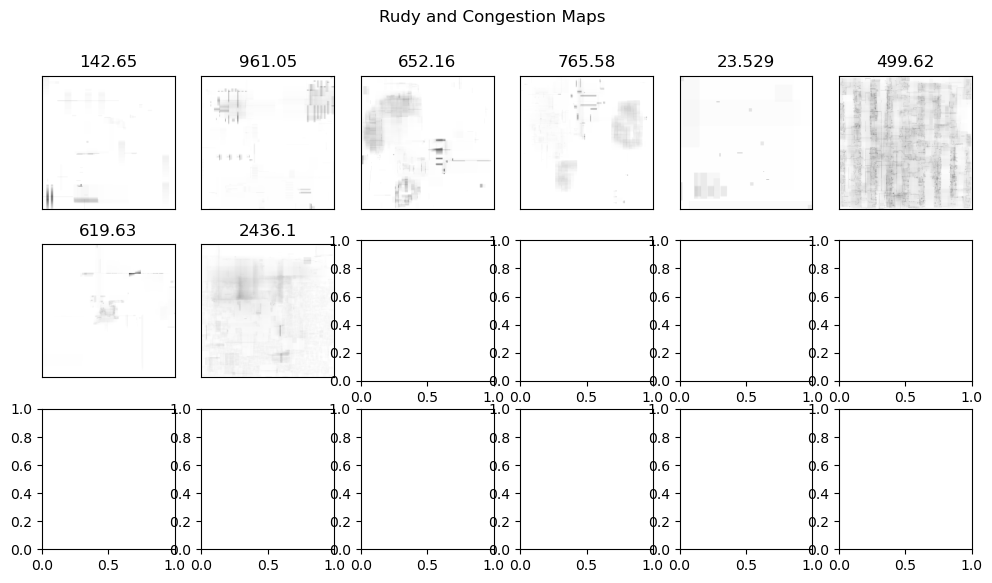

wrote results with keys dict_keys(['identifier', 'idx', 'congestion', 'macro_hpwl']) to results/metrics-ispd2005-s0-chipformer.csv


In [14]:
def get_grid_coords(coords, grid_size):
    """
    converts normalized coords from [-1, 1] to (NxN) discrete grid coordinate.
    Here we index using xy - (0, 0) at bottom left, (N, N) at top right
    Inputs:
    - coords (B, 2)
    Returns:
    - grid_coords int64(B, 2)
    """
    grid_spacing = 2.0/grid_size
    coords = torch.clip(coords, min=-1.0, max=1.0)
    grid_coords = torch.floor((coords + 1) / grid_spacing).to(dtype = torch.int64)
    return grid_coords

def rudy(x, cond, grid_size=512, normalized=True, return_grid=False):
    """
    Computes congestion estimates using RUDY estimator following Wiremask-BBO:
    https://github.com/lamda-bbo/WireMask-BBO
    """
    # eps = 1e-6
    eps = 1.0/grid_size

    grid = torch.zeros((grid_size, grid_size), device=x.device)
    hpwl_net = guidance.MacroHPWL()
    pin_map, pin_offsets, pin_edge_index = guidance.compute_pin_map(cond)
    hpwl_net = hpwl_net(x, pin_map, pin_offsets, pin_edge_index, cond.is_macros, raw_output = True)
    if "chip_size" in cond and not normalized:
        x_scale = (cond.chip_size[2] - cond.chip_size[0])/2 # because chip is from [-1, 1] when normed
        y_scale = (cond.chip_size[3] - cond.chip_size[1])/2
    else:
        x_scale = 1
        y_scale = 1
    
    # hpwl_net has rows of (x_max, y_max, -x_min, -y_min)
    scale_factor = torch.tensor([[x_scale, y_scale, x_scale, y_scale]]).to(device = hpwl_net.device)
    rescaled_hpwl_net = (scale_factor * hpwl_net)
    
    # cull empty nets for efficiency
    net_delta_xy = rescaled_hpwl_net[:,:2] + rescaled_hpwl_net[:,2:]
    nonempty_net_mask = (net_delta_xy[:,0] > eps) & (net_delta_xy[:,1] > eps) # True if nonempty, False if empty
    rescaled_hpwl_net = rescaled_hpwl_net[nonempty_net_mask, :]

    # compute grid coordinates based on normalized x, y locations
    coords_max = rescaled_hpwl_net[:, :2] # (Nets, 2)
    coords_min = -rescaled_hpwl_net[:, 2:] # (Nets, 2)
    grid_coords_max = get_grid_coords(coords_max, grid_size) # top right of net bounding boxes
    grid_coords_min = get_grid_coords(coords_min, grid_size) # bottom left of net bounding boxes
    delta_xy = coords_max - coords_min # (Nets, 2)
    congestion_net = 1/delta_xy[:, 0] + 1/delta_xy[:, 1] # (Nets,) Be careful of instabilities

    # generate congestion map
    num_nets = congestion_net.shape[0]
    for i in range(num_nets):
        net_max = grid_coords_max[i, :]
        net_min = grid_coords_min[i, :]
        grid[net_min[0]:net_max[0], net_min[1]:net_max[1]] += congestion_net[i]

    # get RUDY value using average of top 10%
    sorted_congestion, _ = torch.sort(torch.flatten(grid), descending=True)
    congestion = torch.mean(sorted_congestion[:(grid_size * grid_size)//10]).cpu().item()
    if return_grid:
        return congestion, grid
    else:
        return congestion

print(task, placement_dir)

# Measure and save both congestion and HPWL
metrics = {
    "identifier": [],
    "idx": [],
    "congestion": [],
    "macro_hpwl": [],
}
grids = []
for x, cond in placed_set:
    congestion, congestion_grid = rudy(x, cond, return_grid=True)
    macro_hpwl = utils.macro_hpwl(x, cond, normalized_hpwl=False)[1]
    metrics["identifier"].append(f"{task}-{placement_name}")
    metrics["idx"].append(cond.file_idx)
    metrics["congestion"].append(congestion)
    metrics["macro_hpwl"].append(macro_hpwl)
    grids.append(congestion_grid.cpu().numpy())

print(sum(metrics["congestion"])/len(metrics["congestion"]))
plot_and_print_metrics(metrics["congestion"], grids, nrows = 3, ncols = 6, scale_factor = 1.0, title="Rudy and Congestion Maps")

output_name = f"metrics-{task}-{placement_name}.csv" if placement_dir is not None else f"metrics-{task}.csv"
write_results(metrics, output_name)

## Macro HPWL Measurement

ispd2005-s0 placements/chipformer_validation/ispd2005


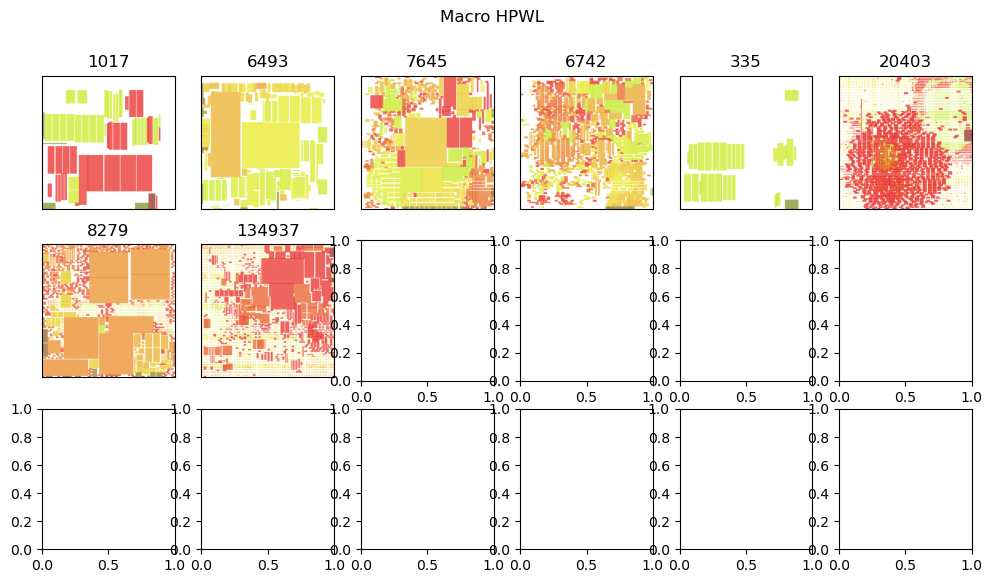

In [8]:
print(task, placement_dir)
plot_and_eval_set(placed_set, utils.macro_hpwl, title="Macro HPWL")
# plot_and_eval_set(placed_set, utils.hpwl_fast, title="HPWL")